In [1]:
from config import *
import h5py
import matplotlib.pyplot as plt
import json
import numpy as np

Using TensorFlow backend.


In [10]:
MODEL_DIR = '../data/logs'
class InferenceConfig(ClomaskConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_RESIZE_MODE = "square"
    IMAGE_MIN_DIM = 1024
    IMAGE_MAX_DIM = 1024
    POST_NMS_ROIS_INFERENCE = 2000
    POST_NMS_ROIS_TRAINING = 2000
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    TRAIN_ROIS_PER_IMAGE = 200
    DETECTION_MAX_INSTANCES = 300
    DETECTION_NMS_THRESHOLD = 0.7
    DETECTION_MIN_CONFIDENCE = 0.85

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir=MODEL_DIR)

model_path = '../mask_data/logs/clomask20190221T1905/mask_rcnn_clomask_0010.h5'
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  ../mask_data/logs/clomask20190221T1905/mask_rcnn_clomask_0004.h5
Re-starting from epoch 4


In [11]:
# set color for class
# tuple(np.random.randint(256, size=3)/1000)
def get_colors_for_class_ids(class_ids):
    colors = []
    for class_id in class_ids:
        if class_id == 1:
            colors.append((.50, .205, .50))
        elif class_id == 2:
            colors.append((.0, .0, .250))
        elif class_id == 3:
            colors.append((.250, .05, .50))
    return colors

In [12]:
from train import ClomaskDataset

# initialize test dataset
test_path = '../mask_data/test_image/'
test_list = os.listdir(test_path)
dataset_test = ClomaskDataset()
dataset_test.load_shapes(test_list, test_path)
dataset_test.prepare()

0.37674445771284815


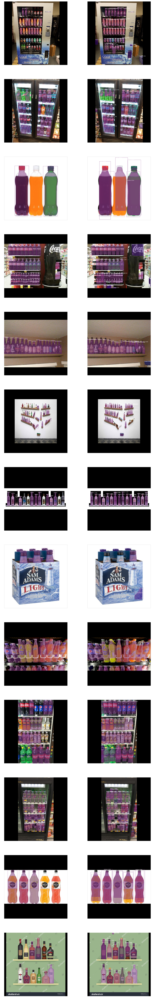

In [13]:
import visualize
# Show few example of ground truth vs. predictions on the validation dataset 
fig = plt.figure(figsize=(30, 200))
i = 0
scores = []
for i in range(len(dataset_test.image_ids)):
    image_id = dataset_test.image_ids[i]
    
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config, 
                               image_id, use_mini_mask=False)
    
#     print(original_image.shape)
    plt.subplot(len(dataset_test.image_ids), 2, 2*i + 1)
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                dataset_test.class_names,
                                colors=get_colors_for_class_ids(gt_class_id), ax=fig.axes[-1])
    
    plt.subplot(len(dataset_test.image_ids), 2, 2*i + 2)
    results = model.detect([original_image]) #, verbose=1)

    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_test.class_names, r['scores'], 
                                colors=get_colors_for_class_ids(r['class_ids']), ax=fig.axes[-1])

    pred_box, pred_class_id, pred_score, pred_mask = r['rois'], r['class_ids'], \
            r['scores'], r['masks']
    gt_box = utils.extract_bboxes(gt_mask)
#         # Compute IoU scores for ground truth and predictions
    mAP = utils.compute_ap_range(gt_box, gt_class_id, gt_mask,
                                 pred_box, pred_class_id, pred_score, pred_mask,
                                 iou_thresholds=None, verbose=0)

    scores.append(mAP)
print(np.mean(scores))

## Using COCO weights

In [34]:
from pathlib import Path

class CocoConfig(ClomaskConfig):
    """Configuration for training on MS COCO.
    Derives from the base Config class and overrides values specific
    to the COCO dataset.
    """
    # Give the configuration a recognizable name
    NAME = "coco"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 2

    # Uncomment to train on 8 GPUs (default is 1)
    # GPU_COUNT = 8

    # Number of classes (including background)
    NUM_CLASSES = 1 + 80  # COCO has 80 classes

class InferenceConfig_base(CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_RESIZE_MODE = "square"
    DETECTION_MAX_INSTANCES = 100
    IMAGE_MIN_DIM = 1024
    IMAGE_MAX_DIM = 1024
    POST_NMS_ROIS_INFERENCE = 1000
    POST_NMS_ROIS_TRAINING = 2000
    RPN_ANCHOR_SCALES = (32, 64, 128, 256, 512)
    TRAIN_ROIS_PER_IMAGE = 200

config = InferenceConfig_base()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MASK_THRESHOLD       0.35
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.85
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_COLOR                    RGB
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 20.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 10.0, 'mrcnn_bbox_loss': 1.0, 'm

In [35]:
# Create model object in inference mode.
COCO_MODEL_PATH = '../data/mask_rcnn_coco.h5'
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

OSError: Unable to open file (unable to open file: name = '../data/mask_rcnn_coco.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [61]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [62]:
class clomaskDataset(object):
    def __init__(self, image_id):
        self.IMAGE_DIR = Path('../data/test_image/{}'.format(image_id))
        self.IMAGE_PATH = os.path.join(self.IMAGE_DIR, 'train_image', image_id + '.jpg')
        self.IMAGE_ID = image_id
        self.CLASS_ID = 40

    def load_image(self):
        img = cv2.imread(self.IMAGE_PATH)
        img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)
        return img
    
    def load_mask(self):
        path = os.path.join(self.IMAGE_DIR, 'train_mask')

        complete_mask = []
        for mask_file in next(os.walk(path))[2]:
            if 'png' in mask_file:
                single_mask = cv2.imread(os.path.join(path + os.path.sep + mask_file), 0)
                if len(single_mask.shape) > 2:
                    single_mask = single_mask[:,:,0]
                    print(single_mask.shape)

                # binary_holes filling
                single_mask = binary_fill_holes(single_mask).astype(np.int32)
                # check for mask to be atleast 1 pixel
                if np.sum(single_mask) >= 1:
                    complete_mask.append(np.squeeze(single_mask))
        complete_mask = np.stack(complete_mask, axis=-1)
        complete_mask = complete_mask.astype(np.uint8)
        
        class_ids = np.zeros(complete_mask.shape[2])
        class_ids[:] = self.CLASS_ID
        class_ids = class_ids.astype(np.int8)
        
        return complete_mask, class_ids

In [55]:
def eval_function(model, config, dataset_val):
    scores = []
    image_ids = dataset_val

    for i, image_id in enumerate(image_ids):
        # Load image and ground truth data
        
        clomask = clomaskDataset(image_id)
        image = clomask.load_image()
        gt_mask, gt_class_id = clomask.load_mask()

        result = model.detect([image], verbose=0)[0]
        
        pred_box, pred_class_id, pred_score, pred_mask = result['rois'], result['class_ids'], \
            result['scores'], result['masks']
#         idx = np.where(pred_class_id==40)
        
#         pred_box, pred_class_id, pred_score, pred_mask = pred_box[idx], pred_class_id[idx], pred_score[idx], pred_mask[idx]
        gt_box = utils.extract_bboxes(gt_mask)
#         # Compute IoU scores for ground truth and predictions
        mAP = utils.compute_ap_range(gt_box, gt_class_id, gt_mask,
                                     pred_box, pred_class_id, pred_score, pred_mask,
                                     iou_thresholds=None, verbose=0)

        scores.append(mAP)
        fig, axes = plt.subplots(1,3, figsize=(16,9))

        axes[0].imshow(image)
        axes[0].set_title('Original Image')

        axes[1].imshow(gt_mask.sum(axis=-1),cmap='hot')
        axes[1].set_title('Actual Mask')

        visualize.display_instances(image, result['rois'], result['masks'], result['class_ids'],
                            class_names, result['scores'], ax = axes[2])
        axes[2].set_title('Predicted Mask')
        fig.get_axes()[0].annotate('mAP value is {}'.format(mAP), (0.5, 0.95), 
                            xycoords='figure fraction', ha='center', 
                            fontsize=14
                            )

    mean_mAP = np.mean(scores)
    print('Final validation mAP is: {}'.format(mean_mAP))

Final validation mAP is: 0.5364218091280542


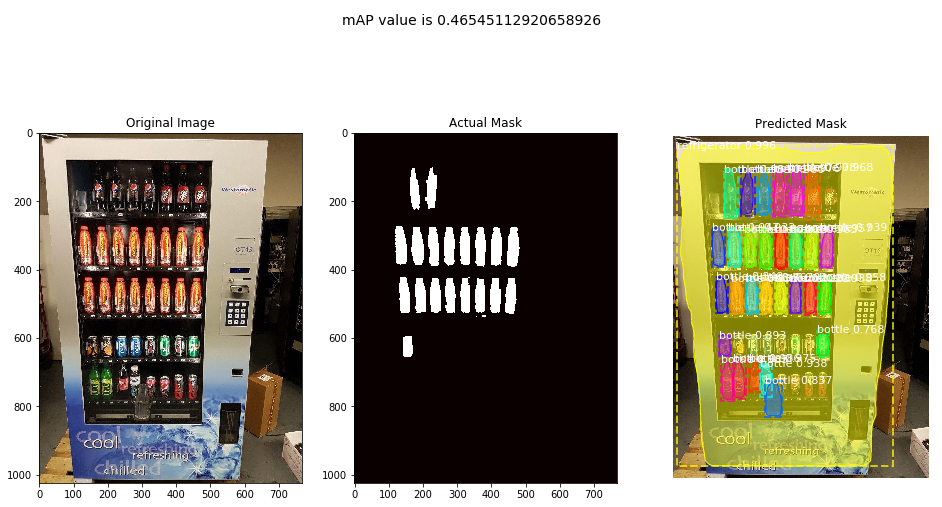

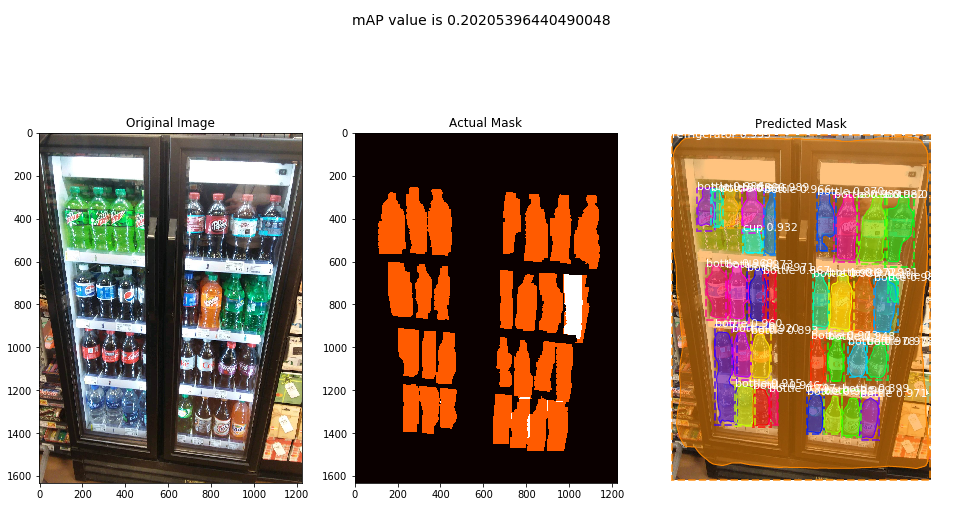

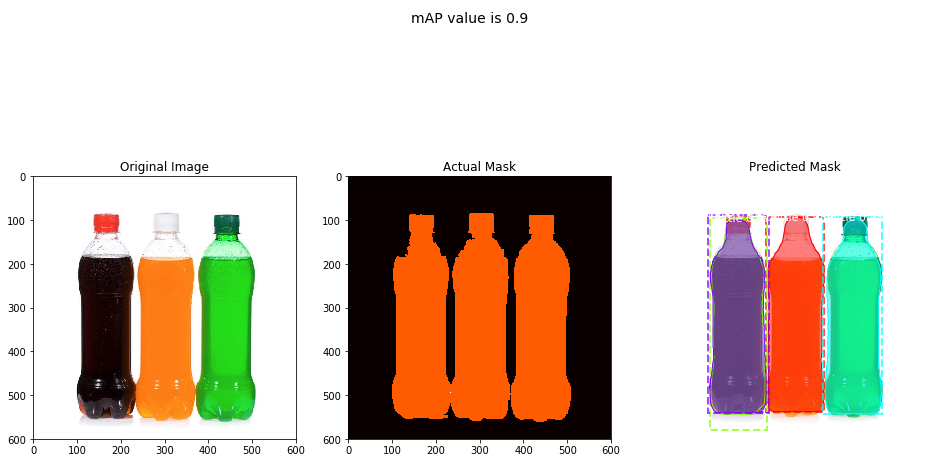

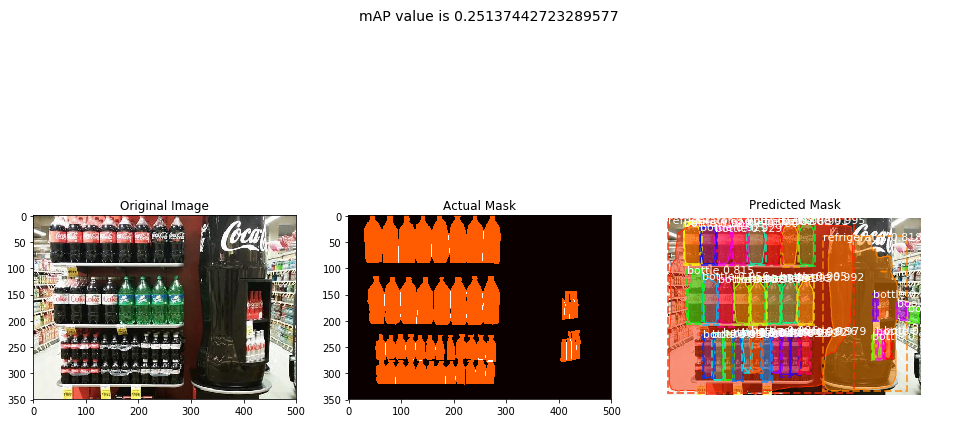

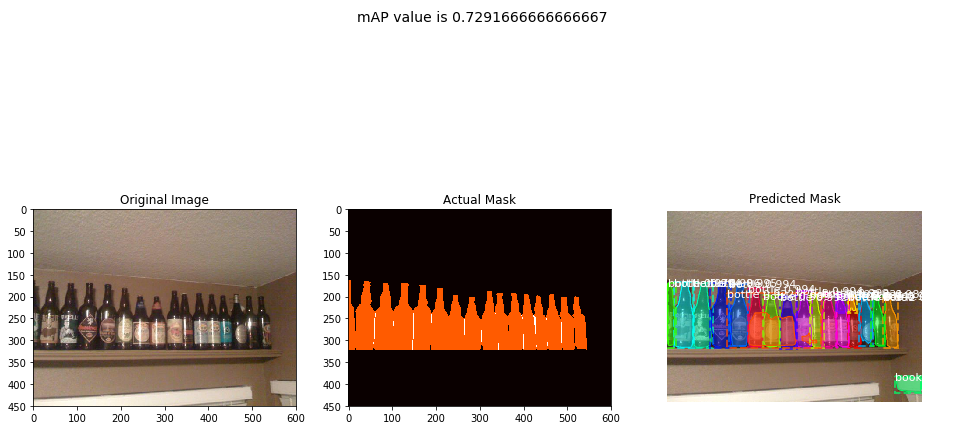

...

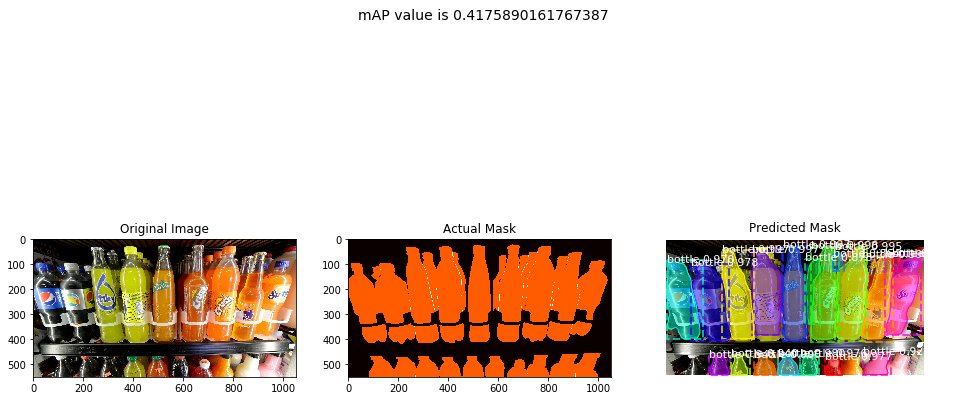

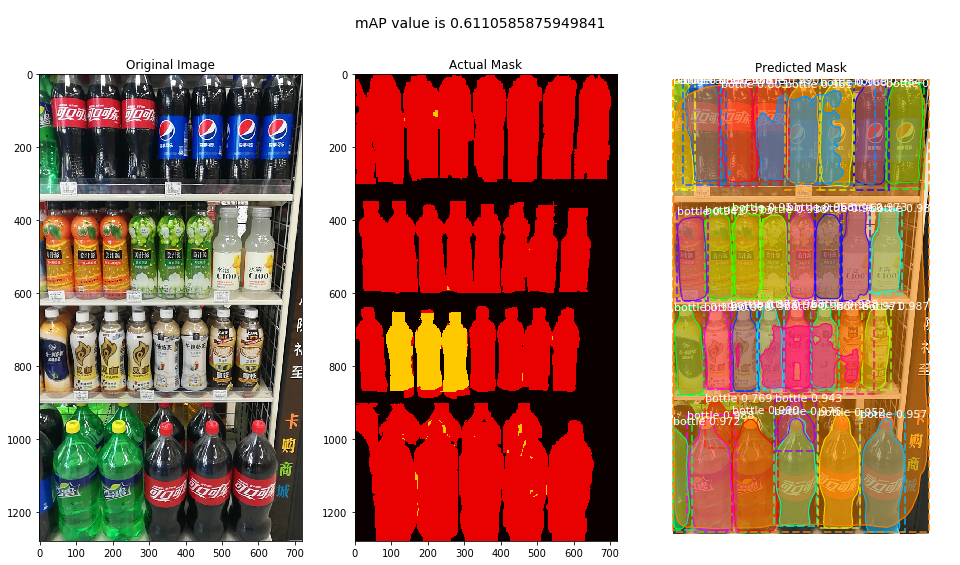

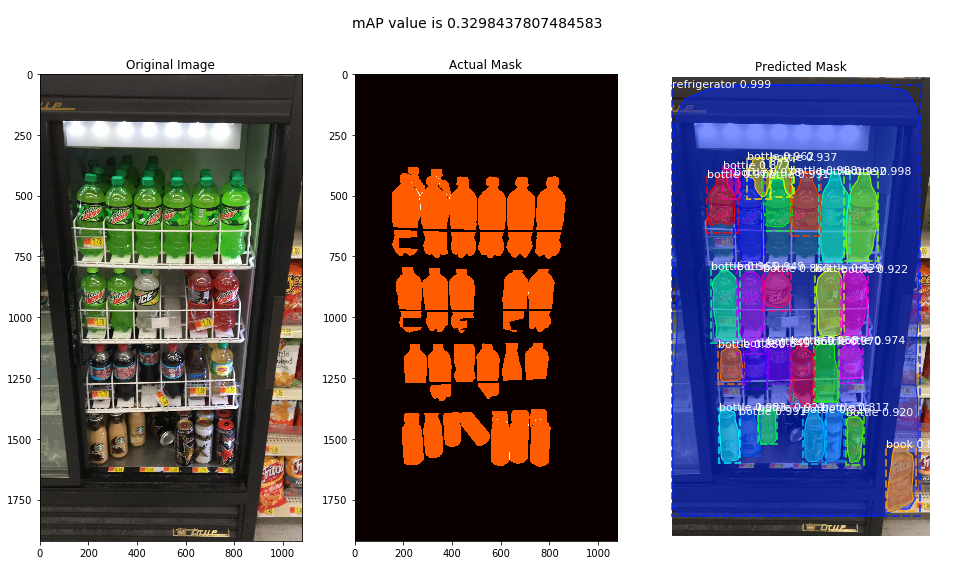

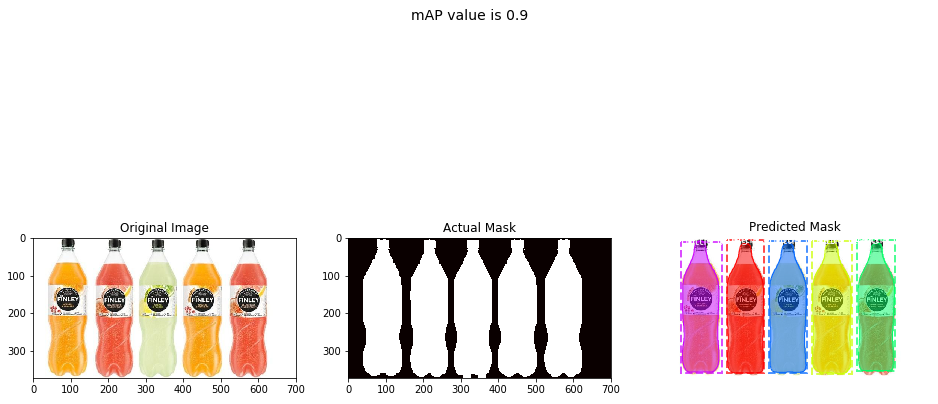

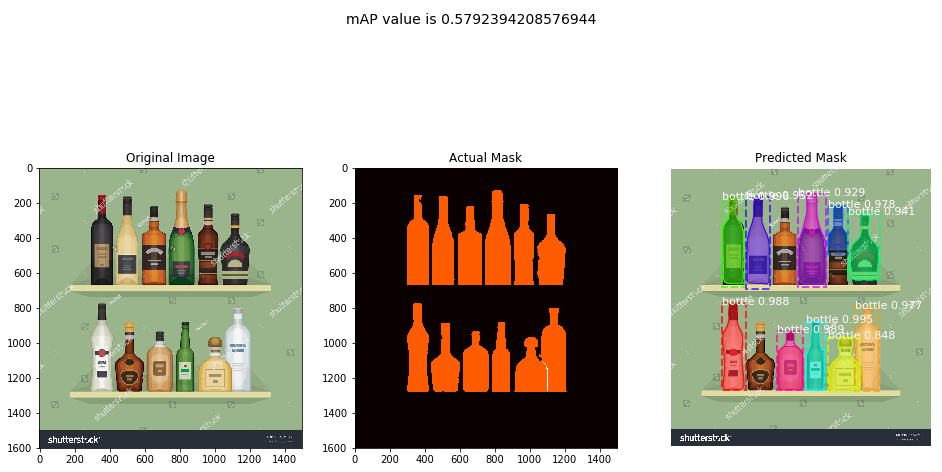

In [63]:
eval_function(model, config, test_list)